# Q1

### Banking sector
    > no. of transactions done in the interval of 30 mins (Poisson distribution)
    > amount of time before (One Time Password sent through mobile) expires (Exponential)
    > no. of customers who said yes to a new credit card offers (Binomial)

### Insurance
    > response to a new inusrance policy can be modelled through binomial distribution
    > no. of accidents claims made in a month (Poisson)
    > the amount of time until a claim is made by the customer (insurer) (Exponential)

### Retail/Supply Chain
    > no. of defective shirts produced by a company (binomial)
    > The number of customers entering a supermarket on a given day (Poisson)
    > the amount of time taken until order checkout (Expoential)

### Healthcare 
    > no. of vaccines administered on a given day (Poisson)
    > no. of patients having who tested postive for cancer (Binomial)
    > the time between successive births in a hospital (Exponential)

### Telecommunication
    > response to a new phone package over different groups or trials (Binomial) 
    > no. of active agents (agents who free and available to take calls) in a call center at any given time  (Poisson)
    > the time between 2 packets arriving from point 1 to point 2

In [150]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from random import sample
from scipy.stats import ttest_ind, ttest_1samp
%matplotlib inline


In [ ]:
#orders file into pandas dataframe
ordersdf = pd.read_csv("Orders.Data.csv")
ordersdf = ordersdf.rename(columns = {"order_purchase_timestamp": "Purchased_At",
                         "order_approved_at":"Approved_At",
                         "order_delivered_carrier_date": "Delivered_to_Carrier_On",
                         "order_delivered_customer_date": "Delivered_to_Customer_On",
                         "order_estimated_delivery_date": "Estimated_Delivery_On"}) 
ordersdf.head(10)


In [111]:
#convert the datetime column into pandas readable date time format
ordersdf['Purchased_At'] = pd.to_datetime(ordersdf['Purchased_At'])
ordersdf['Approved_At'] = pd.to_datetime(ordersdf['Approved_At'])
ordersdf['Delivered_to_Carrier_On'] = pd.to_datetime(ordersdf['Delivered_to_Carrier_On'])
ordersdf['Delivered_to_Customer_On'] = pd.to_datetime(ordersdf['Delivered_to_Customer_On'])
ordersdf['Estimated_Delivery_On'] = pd.to_datetime(ordersdf['Estimated_Delivery_On'])
ordersdf = ordersdf[['order_id','order_status','Purchased_At', 'Approved_At', 'Delivered_to_Carrier_On', 'Delivered_to_Customer_On', 'Estimated_Delivery_On']]
ordersdf.head(10)

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
5,a4591c265e18cb1dcee52889e2d8acc3,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01
6,136cce7faa42fdb2cefd53fdc79a6098,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
7,6514b8ad8028c9f2cc2374ded245783f,delivered,2017-05-16 13:10:30,2017-05-16 13:22:11,2017-05-22 10:07:46,2017-05-26 12:55:51,2017-06-07
8,76c6e866289321a7c93b82b54852dc33,delivered,2017-01-23 18:29:09,2017-01-25 02:50:47,2017-01-26 14:16:31,2017-02-02 14:08:10,2017-03-06
9,e69bfb5eb88e0ed6a785585b27e16dbf,delivered,2017-07-29 11:55:02,2017-07-29 12:05:32,2017-08-10 19:45:24,2017-08-16 17:14:30,2017-08-23


In [112]:
#check 2 rows for each order status
orderstatus = ordersdf['order_status'].unique()
for f in orderstatus:
    print(f)
    print(ordersdf[ordersdf['order_status']== f].head(2))

delivered
                           order_id order_status        Purchased_At  \
0  e481f51cbdc54678b7cc49136f2d6af7    delivered 2017-10-02 10:56:33   
1  53cdb2fc8bc7dce0b6741e2150273451    delivered 2018-07-24 20:41:37   

          Approved_At Delivered_to_Carrier_On Delivered_to_Customer_On  \
0 2017-10-02 11:07:15     2017-10-04 19:55:00      2017-10-10 21:25:13   
1 2018-07-26 03:24:27     2018-07-26 14:31:00      2018-08-07 15:27:45   

  Estimated_Delivery_On  
0            2017-10-18  
1            2018-08-13  
invoiced
                             order_id order_status        Purchased_At  \
6    136cce7faa42fdb2cefd53fdc79a6098     invoiced 2017-04-11 12:22:08   
103  0760a852e4e9d89eb77bf631eaaf1c84     invoiced 2018-08-03 17:44:42   

            Approved_At Delivered_to_Carrier_On Delivered_to_Customer_On  \
6   2017-04-13 13:25:17                     NaT                      NaT   
103 2018-08-07 06:15:14                     NaT                      NaT   

    Estimat

In [113]:
#check rows where order status eq shipped
ordersdf[ordersdf['order_status']=='shipped']


,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On
44,ee64d42b8cf066f35eac1cf57de1aa85,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28
154,6942b8da583c2f9957e990d028607019,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07
162,36530871a5e80138db53bcfd8a104d90,shipped,2017-05-09 11:48:37,2017-05-11 11:45:14,2017-05-11 13:21:47,NaT,2017-06-08
231,4d630f57194f5aba1a3d12ce23e71cd9,shipped,2017-11-17 19:53:21,2017-11-18 19:50:31,2017-11-22 17:28:34,NaT,2017-12-13
299,3b4ad687e7e5190db827e1ae5a8989dd,shipped,2018-06-28 12:52:15,2018-06-28 13:11:09,2018-07-04 15:20:00,NaT,2018-08-03
...,...,...,...,...,...,...,...
98534,a59ef0abffbef8ddaae23600b6ee6604,shipped,2017-11-06 17:35:49,2017-11-07 06:31:44,2017-11-07 18:57:39,NaT,2017-11-24
98779,dab8a6c6bd6ec448df5b3a6b6cb887bc,shipped,2018-07-14 10:12:51,2018-07-16 12:30:58,2018-07-16 14:34:00,NaT,2018-08-03
98932,492aed3c33bac22a8e04138319829283,shipped,2018-07-06 16:26:47,2018-07-06 16:35:10,2018-07-10 12:27:00,NaT,2018-07-26
99113,274a7f7e4f1c17b7434a830e9b8759b1,shipped,2018-06-23 13:25:15,2018-06-23 13:40:11,2018-07-04 13:51:00,NaT,2018-07-24


In [114]:
#what is the average difference between order time and approval time
ordersdf['between_order_approval'] = ordersdf['Approved_At'] - ordersdf['Purchased_At']

#convert the columsn into hours
ordersdf['between_order_approval_hours'] = ordersdf['between_order_approval'].apply(lambda x: (x.total_seconds())/3600)



In [104]:
# check the mean difference between order approvals and order purchased for each order status
agg_mean_orderstatus = ordersdf.pivot_table(columns=['order_status'], values='between_order_approval_hours', aggfunc='mean').round(2)
agg_mean_orderstatus

order_status,approved,canceled,delivered,invoiced,processing,shipped,unavailable
between_order_approval_hours,69.66,14.67,10.28,9.04,17.15,11.73,24.39


In [115]:
ordersdf[ordersdf['order_status']=='approved']
#it seems only 2 rows are there for approved and the values are extremes

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours
44897,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaT,NaT,2017-03-01,0 days 00:12:02,0.200556
88457,132f1e724165a07f6362532bfb97486e,approved,2017-04-25 01:25:34,2017-04-30 20:32:41,NaT,NaT,2017-05-22,5 days 19:07:07,139.118611


In [105]:
#what is the mean of the difference between order purchased and approved
ordersdf['between_order_approval_hours'].mean()

10.41909430191969

In [107]:
#checking processed order status where difference between order purchased and order approved is > 10
ordersdf[(ordersdf['order_status']=='processing') & (ordersdf['between_order_approval_hours'] > 10) ]

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours,Pur_Quarter,...,Pur_Month,Pur_Week,Pur_Day,Pur_Hour,App_Quarter,App_Year,App_Month,App_Week,App_Day,App_Hour
324,d3c8851a6651eeff2f73b0e011ac45d0,processing,2016-10-05 22:44:13,2016-10-06 15:51:05,NaT,NaT,2016-12-09,0 days 17:06:52,17.114444,4,...,10,40,3,22,4.0,2016.0,10.0,40.0,4.0,15.0
1192,745e1d4a7f8c4b548881788d4113bb1d,processing,2017-11-17 06:34:36,2017-11-18 02:15:40,NaT,NaT,2017-12-12,0 days 19:41:04,19.684444,4,...,11,46,5,6,4.0,2017.0,11.0,46.0,6.0,2.0
1619,56ab0ef6726f49b711b84ce62e305c7c,processing,2017-11-21 17:54:26,2017-11-22 17:59:31,NaT,NaT,2017-12-13,1 days 00:05:05,24.084722,4,...,11,47,2,17,4.0,2017.0,11.0,47.0,3.0,17.0
2799,880835c91a5227560bdb8d0f45c60579,processing,2017-03-08 09:10:55,2017-03-09 03:33:21,NaT,NaT,2017-04-04,0 days 18:22:26,18.373889,1,...,3,10,3,9,1.0,2017.0,3.0,10.0,4.0,3.0
2948,369423839b4d9789d69665b7c2361443,processing,2017-11-10 08:56:32,2017-11-11 03:10:33,NaT,NaT,2017-12-05,0 days 18:14:01,18.233611,4,...,11,45,5,8,4.0,2017.0,11.0,45.0,6.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94272,90c3d2abe0d324efde558a3f187018a9,processing,2017-11-13 00:07:07,2017-11-15 02:46:33,NaT,NaT,2017-12-04,2 days 02:39:26,50.657222,4,...,11,46,1,0,4.0,2017.0,11.0,46.0,3.0,2.0
95317,fec76d3c7d37a989bdd3a22911340c75,processing,2018-01-19 14:24:31,2018-01-20 15:22:02,NaT,NaT,2018-02-09,1 days 00:57:31,24.958611,1,...,1,3,5,14,1.0,2018.0,1.0,3.0,6.0,15.0
96623,e5d3a9fd67a092461d0a4e3feb145fb5,processing,2017-12-24 13:33:13,2017-12-27 04:07:00,NaT,NaT,2018-01-19,2 days 14:33:47,62.563056,4,...,12,51,7,13,4.0,2017.0,12.0,52.0,3.0,4.0
98089,10951d02d64917a34959abeb8130601e,processing,2018-02-13 21:02:02,2018-02-15 04:11:21,NaT,NaT,2018-03-13,1 days 07:09:19,31.155278,1,...,2,7,2,21,1.0,2018.0,2.0,7.0,4.0,4.0


In [108]:
ordersdf[(ordersdf['between_order_approval_hours'] > 10) ]
# it seems around 28,000 records have values greater than 10

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours,Pur_Quarter,...,Pur_Month,Pur_Week,Pur_Day,Pur_Hour,App_Quarter,App_Year,App_Month,App_Week,App_Day,App_Hour
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1 days 06:42:50,30.713889,3,...,7,30,2,20,3.0,2018.0,7.0,30.0,4.0,3.0
6,136cce7faa42fdb2cefd53fdc79a6098,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09,2 days 01:03:09,49.052500,2,...,4,15,2,12,2.0,2017.0,4.0,15.0,4.0,13.0
8,76c6e866289321a7c93b82b54852dc33,delivered,2017-01-23 18:29:09,2017-01-25 02:50:47,2017-01-26 14:16:31,2017-02-02 14:08:10,2017-03-06,1 days 08:21:38,32.360556,1,...,1,4,1,18,1.0,2017.0,1.0,4.0,3.0,2.0
12,82566a660a982b15fb86e904c8d32918,delivered,2018-06-07 10:06:19,2018-06-09 03:13:12,2018-06-11 13:29:00,2018-06-19 12:05:52,2018-07-18,1 days 17:06:53,41.114722,2,...,6,23,4,10,2.0,2018.0,6.0,23.0,6.0,3.0
15,dcb36b511fcac050b97cd5c05de84dc3,delivered,2018-06-07 19:03:12,2018-06-12 23:31:02,2018-06-11 14:54:00,2018-06-21 15:34:32,2018-07-04,5 days 04:27:50,124.463889,2,...,6,23,4,19,2.0,2018.0,6.0,24.0,2.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99411,4a69678ecf74bfd34260031c04329b68,delivered,2018-07-22 16:58:38,2018-07-23 12:32:05,2018-07-23 15:12:00,2018-07-24 22:46:38,2018-07-31,0 days 19:33:27,19.557500,3,...,7,29,7,16,3.0,2018.0,7.0,30.0,1.0,12.0
99415,5fabc81b6322c8443648e1b21a6fef21,unavailable,2017-10-10 10:50:03,2017-10-14 18:35:57,NaT,NaT,2017-10-23,4 days 07:45:54,103.765000,4,...,10,41,2,10,4.0,2017.0,10.0,41.0,6.0,18.0
99420,f9e3402be5a5ea63344347582ca9f45f,delivered,2017-06-07 11:02:37,2017-06-08 02:45:24,2017-06-08 14:03:29,2017-06-19 19:19:30,2017-07-05,0 days 15:42:47,15.713056,2,...,6,23,3,11,2.0,2017.0,6.0,23.0,4.0,2.0
99423,38e9133ce29f6bbe35aed9c3863dce01,delivered,2017-10-12 20:54:11,2017-10-14 03:28:24,2017-10-17 17:04:42,2017-11-21 17:06:59,2017-10-31,1 days 06:34:13,30.570278,4,...,10,41,4,20,4.0,2017.0,10.0,41.0,6.0,3.0


In [109]:
#checking counts of  each order status
uniq_orders = ordersdf['order_status'].value_counts()
uniq_orders

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [88]:
#breaking order purchased column into many columns
ordersdf['Pur_Quarter'] = ordersdf['Purchased_At'].apply(lambda x: x.quarter)
ordersdf['Pur_Year'] = ordersdf['Purchased_At'].apply(lambda x: x.year)
ordersdf['Pur_Month'] = ordersdf['Purchased_At'].apply(lambda x: x.month)
ordersdf['Pur_Week'] = ordersdf['Purchased_At'].apply(lambda x: x.week)
ordersdf['Pur_Day'] = ordersdf['Purchased_At'].apply(lambda x: x.isoweekday())
ordersdf['Pur_Hour'] = ordersdf['Purchased_At'].apply(lambda x: x.hour)
ordersdf

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours,Pur_Quarter,...,Pur_Month,Pur_Week,Pur_Day,Pur_Hour,App_Quarter,App_Year,App_Month,App_Week,App_Day,App_Hour
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0 days 00:10:42,0.178333,4,...,10,40,1,10,4.0,2017.0,10.0,40.0,1.0,11.0
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1 days 06:42:50,30.713889,3,...,7,30,2,20,3.0,2018.0,7.0,30.0,4.0,3.0
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0 days 00:16:34,0.276111,3,...,8,32,3,8,3.0,2018.0,8.0,32.0,3.0,8.0
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0 days 00:17:53,0.298056,4,...,11,46,6,19,4.0,2017.0,11.0,46.0,6.0,19.0
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0 days 01:01:50,1.030556,1,...,2,7,2,21,1.0,2018.0,2.0,7.0,2.0,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0 days 00:00:00,0.000000,1,...,3,10,4,9,1.0,2017.0,3.0,10.0,4.0,9.0
99437,63943bddc261676b46f01ca7ac2f7bd8,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0 days 00:11:39,0.194167,1,...,2,6,2,12,1.0,2018.0,2.0,6.0,2.0,13.0
99438,83c1379a015df1e13d02aae0204711ab,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0 days 00:17:33,0.292500,3,...,8,34,7,14,3.0,2017.0,8.0,34.0,7.0,15.0
99439,11c177c8e97725db2631073c19f07b62,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0 days 00:07:54,0.131667,1,...,1,2,1,21,1.0,2018.0,1.0,2.0,1.0,21.0


In [87]:
#breaking order approved column into many columns
ordersdf['App_Quarter'] = ordersdf['Approved_At'].apply(lambda x: x.quarter)
ordersdf['App_Year'] = ordersdf['Approved_At'].apply(lambda x: x.year)
ordersdf['App_Month'] = ordersdf['Approved_At'].apply(lambda x: x.month)
ordersdf['App_Week'] = ordersdf['Approved_At'].apply(lambda x: x.week)
ordersdf['App_Day'] = ordersdf['Approved_At'].apply(lambda x: x.isoweekday())
ordersdf['App_Hour'] = ordersdf['Approved_At'].apply(lambda x: x.hour)
ordersdf

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours,Pur_Quarter,...,Pur_Month,Pur_Week,Pur_Day,Pur_Hour,App_Quarter,App_Year,App_Month,App_Week,App_Day,App_Hour
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0 days 00:10:42,0.178333,4,...,10,40,2,10,4.0,2017.0,10.0,40.0,1.0,11.0
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1 days 06:42:50,30.713889,3,...,7,30,24,20,3.0,2018.0,7.0,30.0,4.0,3.0
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0 days 00:16:34,0.276111,3,...,8,32,8,8,3.0,2018.0,8.0,32.0,3.0,8.0
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0 days 00:17:53,0.298056,4,...,11,46,18,19,4.0,2017.0,11.0,46.0,6.0,19.0
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0 days 01:01:50,1.030556,1,...,2,7,13,21,1.0,2018.0,2.0,7.0,2.0,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0 days 00:00:00,0.000000,1,...,3,10,9,9,1.0,2017.0,3.0,10.0,4.0,9.0
99437,63943bddc261676b46f01ca7ac2f7bd8,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0 days 00:11:39,0.194167,1,...,2,6,6,12,1.0,2018.0,2.0,6.0,2.0,13.0
99438,83c1379a015df1e13d02aae0204711ab,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0 days 00:17:33,0.292500,3,...,8,34,27,14,3.0,2017.0,8.0,34.0,7.0,15.0
99439,11c177c8e97725db2631073c19f07b62,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0 days 00:07:54,0.131667,1,...,1,2,8,21,1.0,2018.0,1.0,2.0,1.0,21.0


In [89]:
#taking the mean of each column
ordersdf.mean()

between_order_approval          0 days 10:25:08.739486910
between_order_approval_hours                      10.4191
Pur_Quarter                                       2.35549
Pur_Year                                          2017.54
Pur_Month                                         6.03222
Pur_Week                                          24.3529
Pur_Day                                           3.75573
Pur_Hour                                          14.7708
App_Quarter                                       2.35558
App_Year                                          2017.54
App_Month                                         6.04024
App_Week                                          24.3919
App_Day                                             3.728
App_Hour                                          12.7341
dtype: object

In [93]:
# checking on what day of the week the orders were mostly purchased
ordersdf['Pur_Day'].value_counts()
#the highest frequency was on monday

1    16196
2    15963
3    15552
4    14761
5    14122
7    11960
6    10887
Name: Pur_Day, dtype: int64

In [94]:
#checking on what hour of the day the orders were mostly purchased
ordersdf['Pur_Hour'].value_counts()
# they were mostly purchased at 4 pm

16    6675
11    6578
14    6569
13    6518
15    6454
21    6217
20    6193
10    6177
17    6150
12    5995
19    5982
22    5816
18    5769
9     4785
23    4123
8     2967
0     2394
7     1231
1     1170
2      510
6      502
3      272
4      206
5      188
Name: Pur_Hour, dtype: int64

In [95]:
#checking on what hour of the day the orders were mostly approved
ordersdf['App_Hour'].value_counts()
# they were mostly approved ot 2 am 

2.0     7038
16.0    5896
13.0    5577
3.0     5547
17.0    5490
11.0    5345
14.0    5342
15.0    5315
18.0    5047
19.0    5013
20.0    4955
10.0    4861
21.0    4714
22.0    4700
12.0    4580
9.0     3779
23.0    3507
4.0     3350
8.0     2259
0.0     1972
1.0     1529
7.0     1488
5.0     1048
6.0      929
Name: App_Hour, dtype: int64

In [110]:
#checking on what day of the week the orders were mostly approved
ordersdf['App_Day'].value_counts()
# they were mostly approved on Tuesday

2.0    19154
3.0    15786
4.0    15471
5.0    14659
1.0    13001
6.0    12196
7.0     9014
Name: App_Day, dtype: int64

In [96]:
#checking mean of the difference between order apporved and order purchased for each month 
ordersdf.pivot_table(columns=['Pur_Month'], values='between_order_approval_hours', aggfunc='mean').round(2)

Pur_Month,1,2,3,4,5,6,7,8,9,10,11,12
between_order_approval_hours,10.69,9.77,7.86,14.46,9.39,9.02,12.06,8.89,11.43,11.21,10.89,10.91


In [102]:
more_than_100 = ordersdf[(ordersdf['between_order_approval_hours'] > 100) ]
more_than_100['Pur_Day'].value_counts()

5    226
4    146
6     90
2     55
1     51
3     48
7     38
Name: Pur_Day, dtype: int64

In [103]:
more_than_100['App_Day'].value_counts()

2.0    202
4.0    136
3.0    123
5.0     63
1.0     48
7.0     44
6.0     38
Name: App_Day, dtype: int64

In [121]:
ordersdf['between_order_approval_hours'].describe()
# we see that maximum difference is coming as 4509 which is way to much


count    99281.000000
mean        10.419094
std         26.038004
min          0.000000
25%          0.215000
50%          0.343333
75%         14.580833
max       4509.180556
Name: between_order_approval_hours, dtype: float64

<AxesSubplot:ylabel='between_order_approval_hours'>

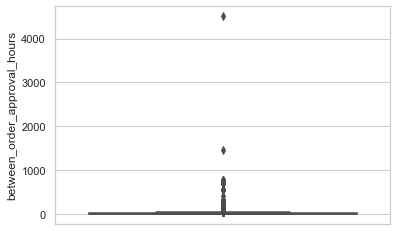

In [124]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=ordersdf['between_order_approval_hours'])

it seems we have outliers as shown here

In [127]:
more_than_1000 = ordersdf[ordersdf['between_order_approval_hours'] > 1000]
more_than_1000
#lets remove these from our dataset

,order_id,order_status,Purchased_At,Approved_At,Delivered_to_Carrier_On,Delivered_to_Customer_On,Estimated_Delivery_On,between_order_approval,between_order_approval_hours
47552,1612081119e8f23745698ad3367cc14b,unavailable,2016-10-05 18:06:48,2017-04-11 15:17:38,NaT,NaT,2016-11-17,187 days 21:10:50,4509.180556
62293,2e5dc86c8c4aa663549caf5e31de840d,processing,2017-02-03 00:04:49,2017-04-04 10:56:48,NaT,NaT,2017-03-31,60 days 10:51:59,1450.866389


In [129]:
#after removing those 2 outliers
ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 1000]
ordersdf['between_order_approval_hours'].mean()

10.359270887543634

<AxesSubplot:ylabel='between_order_approval_hours'>

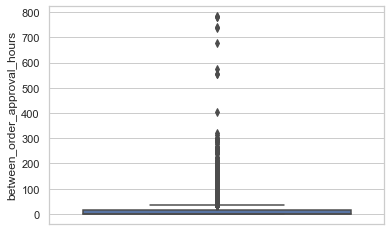

In [130]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=ordersdf['between_order_approval_hours'])

In [131]:
#lets remove values greater than 300
ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 300]
ordersdf['between_order_approval_hours'].mean()

10.284826890487288

<AxesSubplot:ylabel='between_order_approval_hours'>

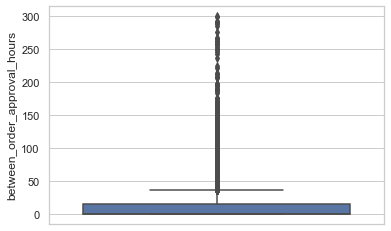

In [132]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=ordersdf['between_order_approval_hours'])

In [133]:
filtered_ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 70]
filtered_ordersdf['between_order_approval_hours'].mean()

8.19041324557451

<AxesSubplot:ylabel='between_order_approval_hours'>

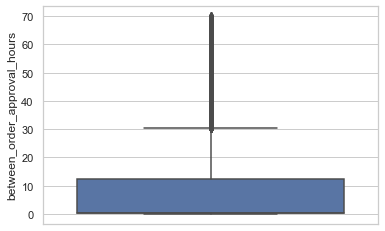

In [134]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=filtered_ordersdf['between_order_approval_hours'])

In [135]:
#lets remove all that are greater than 35
filtered2_ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 35]
filtered2_ordersdf['between_order_approval_hours'].mean()

5.001706812769817

<AxesSubplot:ylabel='between_order_approval_hours'>

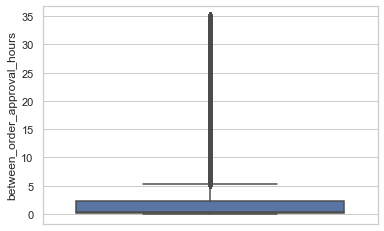

In [136]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=filtered2_ordersdf['between_order_approval_hours'])

In [137]:
filtered2_ordersdf['between_order_approval_hours'].median()
#we see median of filtered datset is 0.3 

0.30277777777777776

In [140]:
filtered2_ordersdf['between_order_approval_hours']
#dataset reduced to 89541

0         0.178333
1        30.713889
2         0.276111
3         0.298056
4         1.030556
           ...    
99436     0.000000
99437     0.194167
99438     0.292500
99439     0.131667
99440    14.382778
Name: between_order_approval_hours, Length: 89541, dtype: float64

In [141]:
ordersdf['between_order_approval_hours'].median()
#median of orginal dataset

0.3433333333333333

In [142]:
#lets remove all that are greater than or eq 10
filtered3_ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 10]
filtered3_ordersdf['between_order_approval_hours'].mean()

0.6440786347347613

In [143]:
filtered3_ordersdf['between_order_approval_hours']
# dataset reduced to 71000

0        0.178333
2        0.276111
3        0.298056
4        1.030556
5        0.218889
           ...   
99435    0.166389
99436    0.000000
99437    0.194167
99438    0.292500
99439    0.131667
Name: between_order_approval_hours, Length: 71221, dtype: float64

<AxesSubplot:ylabel='between_order_approval_hours'>

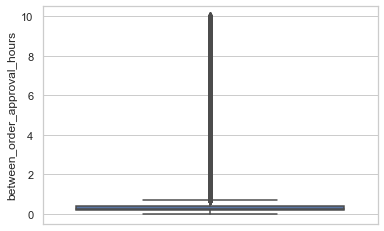

In [144]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=filtered3_ordersdf['between_order_approval_hours'])

In [145]:
filtered3_ordersdf['between_order_approval_hours'].describe()
# we see that now mean is 0.644

count    71221.000000
mean         0.644079
std          1.378302
min          0.000000
25%          0.194167
50%          0.252778
75%          0.390556
max          9.999722
Name: between_order_approval_hours, dtype: float64

In [146]:
filtered3_ordersdf['between_order_approval_hours'].median()

0.25277777777777777

In [188]:
#lets remove all that are greater than or eq 2
filtered4_ordersdf = ordersdf[ordersdf['between_order_approval_hours'] < 2]
filtered4_ordersdf['between_order_approval_hours'].mean()

0.33629512271046724

<AxesSubplot:ylabel='between_order_approval_hours'>

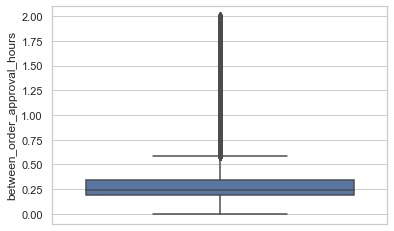

In [189]:
sns.set_theme(style="whitegrid")
sns.boxplot(y=filtered4_ordersdf['between_order_approval_hours'])

In [190]:
filtered4_ordersdf['between_order_approval_hours'].describe()

count    66747.000000
mean         0.336295
std          0.284424
min          0.000000
25%          0.190833
50%          0.243889
75%          0.348056
max          1.999444
Name: between_order_approval_hours, dtype: float64

it seems that due to many outliers as shown in the above analysis and after removing them we see mean coming in about 0.336.